In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt # for making figures
%matplotlib inline

In [2]:
# read in all the words
words = open('names.txt', 'r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [3]:
len(words)

32033

In [4]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [17]:
# build the dataset

block_size = 3 # context length: how many characters do we take to predict the next one?
X, Y = [], []
for w in words:
  
  #print(w)
  context = [0] * block_size
  #print(context)
  for ch in w + '.':
    ix = stoi[ch]
    X.append(context)
    Y.append(ix)
    #print(''.join(itos[i] for i in context), '--->', itos[ix])
    context = context[1:] + [ix] # crop and append
    
  
X = torch.tensor(X)
Y = torch.tensor(Y)


emma
[0, 0, 0]
... ---> e
[0, 0, 5]
..e ---> m
[0, 5, 13]
.em ---> m
[5, 13, 13]
emm ---> a
[13, 13, 1]
mma ---> .
[13, 1, 0]
olivia
[0, 0, 0]
... ---> o
[0, 0, 15]
..o ---> l
[0, 15, 12]
.ol ---> i
[15, 12, 9]
oli ---> v
[12, 9, 22]
liv ---> i
[9, 22, 9]
ivi ---> a
[22, 9, 1]
via ---> .
[9, 1, 0]
ava
[0, 0, 0]
... ---> a
[0, 0, 1]
..a ---> v
[0, 1, 22]
.av ---> a
[1, 22, 1]
ava ---> .
[22, 1, 0]
isabella
[0, 0, 0]
... ---> i
[0, 0, 9]
..i ---> s
[0, 9, 19]
.is ---> a
[9, 19, 1]
isa ---> b
[19, 1, 2]
sab ---> e
[1, 2, 5]
abe ---> l
[2, 5, 12]
bel ---> l
[5, 12, 12]
ell ---> a
[12, 12, 1]
lla ---> .
[12, 1, 0]
sophia
[0, 0, 0]
... ---> s
[0, 0, 19]
..s ---> o
[0, 19, 15]
.so ---> p
[19, 15, 16]
sop ---> h
[15, 16, 8]
oph ---> i
[16, 8, 9]
phi ---> a
[8, 9, 1]
hia ---> .
[9, 1, 0]
charlotte
[0, 0, 0]
... ---> c
[0, 0, 3]
..c ---> h
[0, 3, 8]
.ch ---> a
[3, 8, 1]
cha ---> r
[8, 1, 18]
har ---> l
[1, 18, 12]
arl ---> o
[18, 12, 15]
rlo ---> t
[12, 15, 20]
lot ---> t
[15, 20, 20]
ott ---> e

In [7]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

In [8]:
# build the dataset
block_size = 3 # context length: how many characters do we take to predict the next one?

def build_dataset(words):  
  X, Y = [], []
  for w in words:

    #print(w)
    context = [0] * block_size # list of zeros of length block_size
    for ch in w + '.':
      ix = stoi[ch] # get index of ch
      X.append(context)
      Y.append(ix)
      #print(''.join(itos[i] for i in context), '--->', itos[ix])
      context = context[1:] + [ix] # crop and append

  X = torch.tensor(X)
  Y = torch.tensor(Y)
  print(X.shape, Y.shape)
  return X, Y

import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))
n2 = int(0.9*len(words))

Xtr, Ytr = build_dataset(words[:n1])
Xdev, Ydev = build_dataset(words[n1:n2])
Xte, Yte = build_dataset(words[n2:])


torch.Size([182625, 3]) torch.Size([182625])
torch.Size([22655, 3]) torch.Size([22655])
torch.Size([22866, 3]) torch.Size([22866])


In [10]:
C = torch.randn((27, 2))
C

tensor([[-0.3000,  0.6699],
        [-0.0036, -0.0397],
        [ 1.0816,  1.8858],
        [ 1.9638,  0.5506],
        [ 0.5635,  0.2356],
        [ 2.0757, -1.4309],
        [ 1.6701, -0.2612],
        [ 1.6967, -2.1758],
        [-0.6925, -0.7798],
        [-1.1557,  2.0762],
        [ 0.1550,  0.3029],
        [-2.3659, -0.5293],
        [ 0.4833,  0.8863],
        [ 0.0551,  0.7666],
        [ 0.0094, -0.3240],
        [ 1.7781,  0.7415],
        [ 0.5599, -0.1021],
        [ 1.2563,  0.6637],
        [-1.3010,  0.3065],
        [ 0.3941,  0.4651],
        [-0.6094, -0.3875],
        [-0.4967,  2.0722],
        [ 0.5726, -0.2848],
        [-0.1476,  0.1320],
        [-0.8284, -1.4454],
        [-0.3713,  0.0280],
        [ 0.0976,  0.3915]])

In [11]:
emb = C[X]
emb.shape

torch.Size([228146, 3, 2])

In [ ]:
W1 = torch.randn((6, 100))
b1 = torch.randn(100)

In [ ]:
h = torch.tanh(emb.view(-1, 6) @ W1 + b1)

In [ ]:
h

In [ ]:
h.shape

In [ ]:
W2 = torch.randn((100, 27))
b2 = torch.randn(27)

In [ ]:
logits = h @ W2 + b2

In [ ]:
logits.shape

In [ ]:
counts = logits.exp()

In [ ]:
prob = counts / counts.sum(1, keepdims=True)

In [ ]:
prob.shape

In [ ]:
loss = -prob[torch.arange(32), Y].log().mean()
loss

In [ ]:
# ------------ now made respectable :) ---------------

In [780]:
Xtr.shape, Ytr.shape # dataset

(torch.Size([182441, 3]), torch.Size([182441]))

In [790]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 10), generator=g)
W1 = torch.randn((30, 200), generator=g)
b1 = torch.randn(200, generator=g)
W2 = torch.randn((200, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [791]:
sum(p.nelement() for p in parameters) # number of parameters in total

11897

In [792]:
for p in parameters:
  p.requires_grad = True

In [793]:
lre = torch.linspace(-3, 0, 1000)
lrs = 10**lre

In [794]:
lri = []
lossi = []
stepi = []

In [795]:
for i in range(200000):
  
  # minibatch construct
  ix = torch.randint(0, Xtr.shape[0], (32,))
  
  # forward pass
  emb = C[Xtr[ix]] # (32, 3, 10)
  h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 200)
  logits = h @ W2 + b2 # (32, 27)
  loss = F.cross_entropy(logits, Ytr[ix])
  #print(loss.item())
  
  # backward pass
  for p in parameters:
    p.grad = None
  loss.backward()
  
  # update
  #lr = lrs[i]
  lr = 0.1 if i < 100000 else 0.01
  for p in parameters:
    p.data += -lr * p.grad

  # track stats
  #lri.append(lre[i])
  stepi.append(i)
  lossi.append(loss.log10().item())

#print(loss.item())

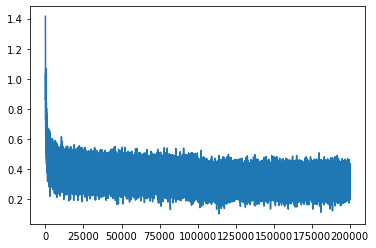

In [796]:
plt.plot(stepi, lossi)

In [797]:
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
loss

tensor(2.1260, grad_fn=<NllLossBackward0>)

In [798]:
emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
loss

tensor(2.1701, grad_fn=<NllLossBackward0>)

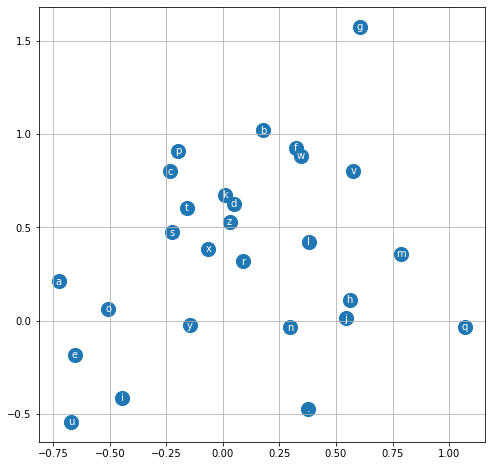

In [710]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')

In [ ]:
# training split, dev/validation split, test split
# 80%, 10%, 10%

In [805]:
context = [0] * block_size
C[torch.tensor([context])].shape

torch.Size([1, 3, 10])

In [820]:


# sample from the model
g = torch.Generator().manual_seed(2147483647 + 10)

for _ in range(20):
    
    out = []
    context = [0] * block_size # initialize with all ...
    while True:
      emb = C[torch.tensor([context])] # (1,block_size,d)
      h = torch.tanh(emb.view(1, -1) @ W1 + b1)
      logits = h @ W2 + b2
      probs = F.softmax(logits, dim=1)
      ix = torch.multinomial(probs, num_samples=1, generator=g).item()
      context = context[1:] + [ix]
      out.append(ix)
      if ix == 0:
        break
    
    print(''.join(itos[i] for i in out))

carmahela.
jhovi.
kimrin.
thil.
halanna.
jazhien.
amerynci.
aqui.
nellara.
chaiiv.
kaleigh.
ham.
joce.
quinton.
lilea.
jamilio.
jeron.
jaryni.
jace.
chrudeley.
